In [1]:
pip install ucimlrepo

In [2]:
import warnings
warnings.simplefilter('ignore', category=FutureWarning)
import pandas as pd
import seaborn as sns
import numpy as np
from ucimlrepo import fetch_ucirepo
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from scipy.stats import chisquare
import torch
from torch.utils.tensorboard import SummaryWriter
import torch.nn as nn
import torch.optim as optim
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

Since we are using tensorboard for visualisation of various metrics we need to clear the logs before each run.

In [3]:
import shutil
import os

# Specify the directory to be cleared
log_dir = 'runs'

# Delete the entire 'runs' directory
shutil.rmtree(log_dir, ignore_errors=True)

# Recreate an empty 'runs' directory
os.makedirs(log_dir, exist_ok=True)


In [4]:
# fetch dataset
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17)

# data (as pandas dataframes)
X = breast_cancer_wisconsin_diagnostic.data.features
y = breast_cancer_wisconsin_diagnostic.data.targets

df = X.join(y)

# metadata
print(breast_cancer_wisconsin_diagnostic.metadata)

# variable information
print(breast_cancer_wisconsin_diagnostic.variables)

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

The Dataset does not seem to have any missing values. ID and Diagnosis are categorical features while all other features are numeric (Continuous)

In [5]:
df.shape

(569, 31)

In [6]:
df.isnull().values.any()

False

Confirmed that there are no nulls

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

Ignoring the ID. All columns except Diagnosis are numeric of type float64 while Dianosis is a Categorical feature.

## Converting the columns to numeric

In [8]:
df.apply(lambda s: pd.to_numeric(s, errors='coerce').notnull().all())

radius1                True
texture1               True
perimeter1             True
area1                  True
smoothness1            True
compactness1           True
concavity1             True
concave_points1        True
symmetry1              True
fractal_dimension1     True
radius2                True
texture2               True
perimeter2             True
area2                  True
smoothness2            True
compactness2           True
concavity2             True
concave_points2        True
symmetry2              True
fractal_dimension2     True
radius3                True
texture3               True
perimeter3             True
area3                  True
smoothness3            True
compactness3           True
concavity3             True
concave_points3        True
symmetry3              True
fractal_dimension3     True
Diagnosis             False
dtype: bool

## Target column Diagnosis have 357 Benign and 212 Malignant classifications. It is near balanced and hence good for training.

In [9]:
df['Diagnosis'].value_counts()

B    357
M    212
Name: Diagnosis, dtype: int64

Dropping the duplicate rows if any

In [10]:
df.drop_duplicates(keep='first', inplace=True)

## Understanding the numeric features

In [11]:
df.describe()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


We can infer from above that there are some features where the max or min is farther away more than the magnitude of the standard deviation which indicates that there are outliers. We can see them in a boxplot below:

<Axes: >

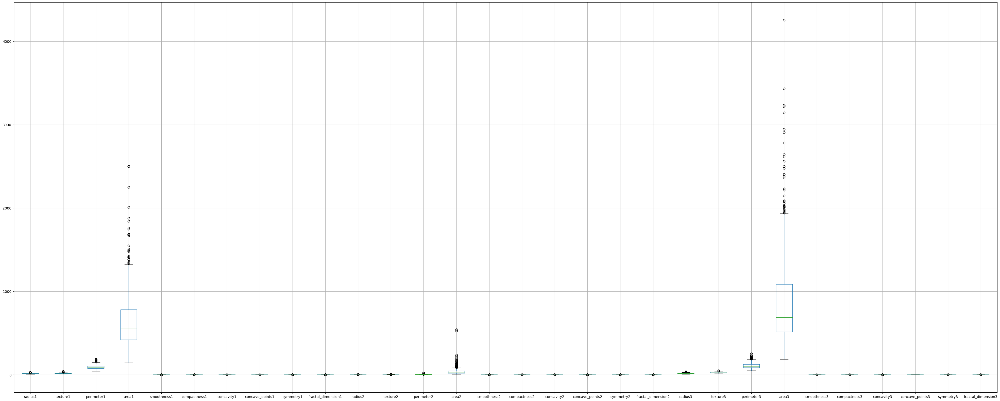

In [12]:
df.boxplot(figsize=(50,20))

## Replacing the outliers with Median of the respective feature

In [13]:
def remove_outlier(x):
    median = np.median(df[x])
    Q1 = np.percentile(df[x], 25, method = 'midpoint')
    Q3 = np.percentile(df[x], 75, method = 'midpoint')
    IQR = Q3 - Q1
    upper= Q3 + 1.5*IQR
    lower= Q1 - 1.5*IQR

    #Here we are using the upperbound and lowerbounds and replacing the same with the Mean of the respective feature. //Replace with median not mean
    df[x] = np.where(df[x] > upper, median, df[x])
    df[x] = np.where(df[x] < lower, median, df[x])

for i in ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3']:
    remove_outlier(i)

## Mapping the binary classes to 0 and 1 to be able to use them in the model

In [14]:
# Mapping 'M' to 1 and 'B' to 2 in the 'Diagnosis' column
df['Diagnosis'] = df['Diagnosis'].replace({'M': 0, 'B': 1})

# Displaying unique values after replacing
print(df['Diagnosis'].unique())

[0 1]


## Correlation Matrix of the dataset

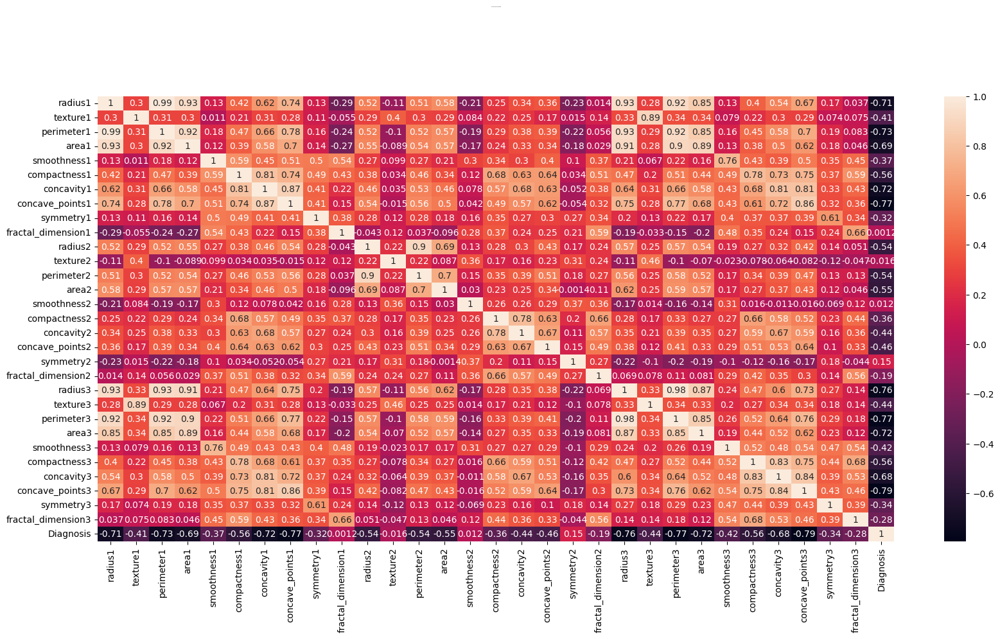

In [15]:
plt.figure(figsize=(20, 9))
sns.heatmap(df.corr(),annot=True).set_title('Correlation Heatmap', fontdict={'fontsize':1}, pad=100);

Most of the features have a negative correlation with a couple of features having positive correlations. Let's see them in an descending order below:

In [16]:
corr_matrix = df.corr()
print(corr_matrix["Diagnosis"].sort_values(ascending=False))

Diagnosis             1.000000
symmetry2             0.150086
smoothness2           0.012418
fractal_dimension1    0.001162
texture2             -0.016333
fractal_dimension2   -0.192127
fractal_dimension3   -0.281301
symmetry1            -0.324820
symmetry3            -0.340809
compactness2         -0.358056
smoothness1          -0.366718
texture1             -0.413582
smoothness3          -0.421017
texture3             -0.440881
concavity2           -0.442252
concave_points2      -0.455424
perimeter2           -0.536458
radius2              -0.540139
area2                -0.554141
compactness1         -0.563087
compactness3         -0.564911
concavity3           -0.678608
area1                -0.693342
radius1              -0.714999
area3                -0.720035
concavity1           -0.724475
perimeter1           -0.732293
radius3              -0.762586
concave_points1      -0.770672
perimeter3           -0.774019
concave_points3      -0.793566
Name: Diagnosis, dtype: float64


In [17]:
df.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3', 'Diagnosis'],
      dtype='object')

## Feature Importance using Chi-Square

In [18]:
from scipy.stats import chi2_contingency
import pandas as pd
from scipy.stats import chisquare
feature_columns = ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3']

result = pd.DataFrame(columns=["Features", "Chi2Weights"])

for column in feature_columns:
    chi2, p = chisquare(df[column])
    result = result.append({"Features": column, "Chi2Weights": chi2}, ignore_index=True)

result = result.sort_values(by="Chi2Weights", ascending=False)
print(result)


              Features    Chi2Weights
23               area3  109582.220630
3                area1   67211.703407
13               area2    5137.602402
22          perimeter3    4606.308363
2           perimeter1    2887.162635
21            texture3     759.209014
20             radius3     615.822134
1             texture1     476.316594
0              radius1     394.011309
12          perimeter2     277.252408
11            texture2      88.802148
26          concavity3      73.490611
10             radius2      42.352502
25        compactness3      38.879499
6           concavity1      29.994499
27     concave_points3      21.414027
7      concave_points1      14.901055
5         compactness1      11.340224
16          concavity2       6.378395
28           symmetry3       4.372968
15        compactness2       3.852226
24         smoothness3       1.967822
8            symmetry1       1.782624
29  fractal_dimension3       1.299073
17     concave_points2       1.204949
4          s

We are considering only those features who have the values > 50

In [19]:
result[result['Chi2Weights']>50]

,Features,Chi2Weights
23,area3,109582.220630
3,area1,67211.703407
13,area2,5137.602402
22,perimeter3,4606.308363
2,perimeter1,2887.162635
21,texture3,759.209014
20,radius3,615.822134
1,texture1,476.316594
0,radius1,394.011309
12,perimeter2,277.252408


In [20]:
important_columns = result[result['Chi2Weights']>50]['Features'].values

## Understanding the distribution of the data

array([<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>], dtype=object)

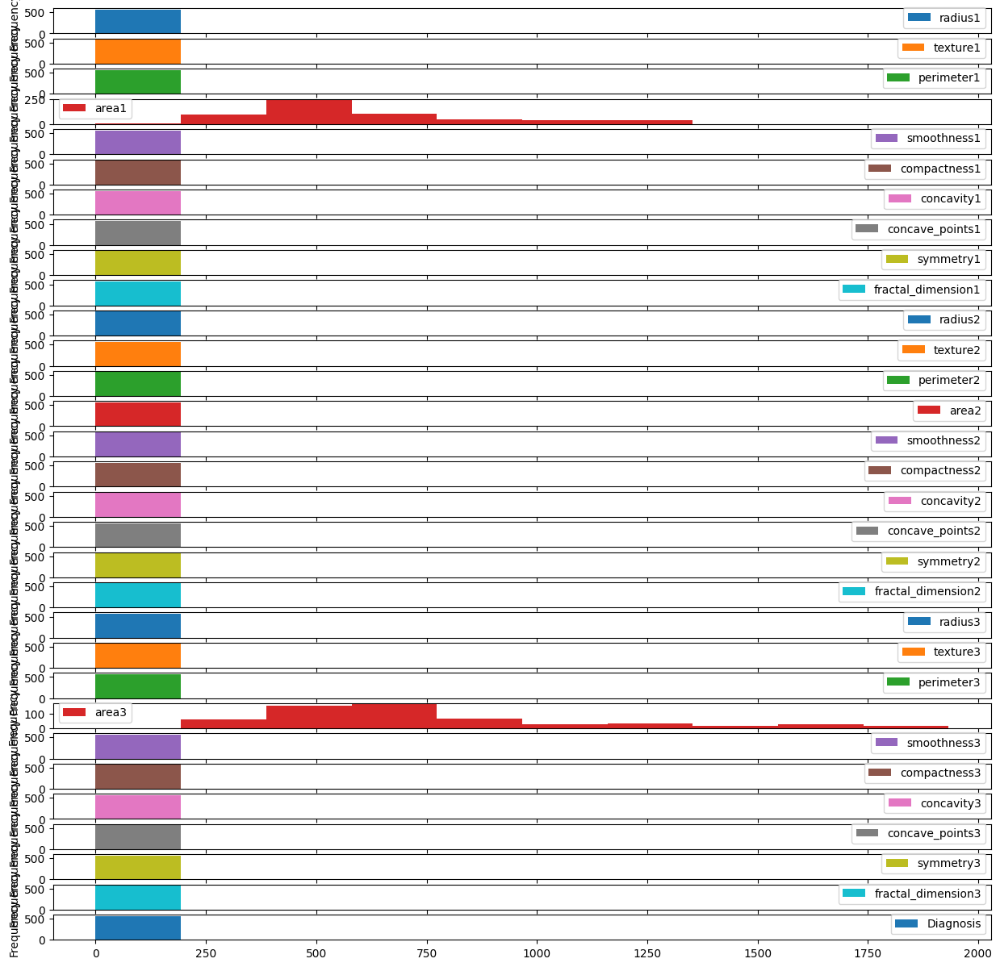

In [21]:
df.plot(kind='hist', legend=True, subplots=True, figsize =(15,15))

Histogram plot shows that area1 and area3 have a larger range and hence the data needs to be standardized

In [22]:
df.skew(axis = 0).sort_values()

Diagnosis            -0.528461
smoothness3           0.182449
smoothness1           0.192048
symmetry1             0.250435
symmetry3             0.251405
texture3              0.290453
concave_points2       0.320325
texture1              0.364262
concave_points3       0.492616
texture2              0.568195
fractal_dimension1    0.579465
smoothness2           0.616878
radius1               0.624653
perimeter1            0.661643
fractal_dimension3    0.697918
concavity3            0.739678
compactness1          0.754584
symmetry2             0.770571
concavity2            0.804049
radius3               0.820337
compactness3          0.828786
perimeter3            0.840099
fractal_dimension2    0.877862
compactness2          0.924296
concave_points1       0.946469
concavity1            0.963532
area1                 1.007852
perimeter2            1.052149
radius2               1.122414
area3                 1.183372
area2                 1.580961
dtype: float64

## Distribution plot

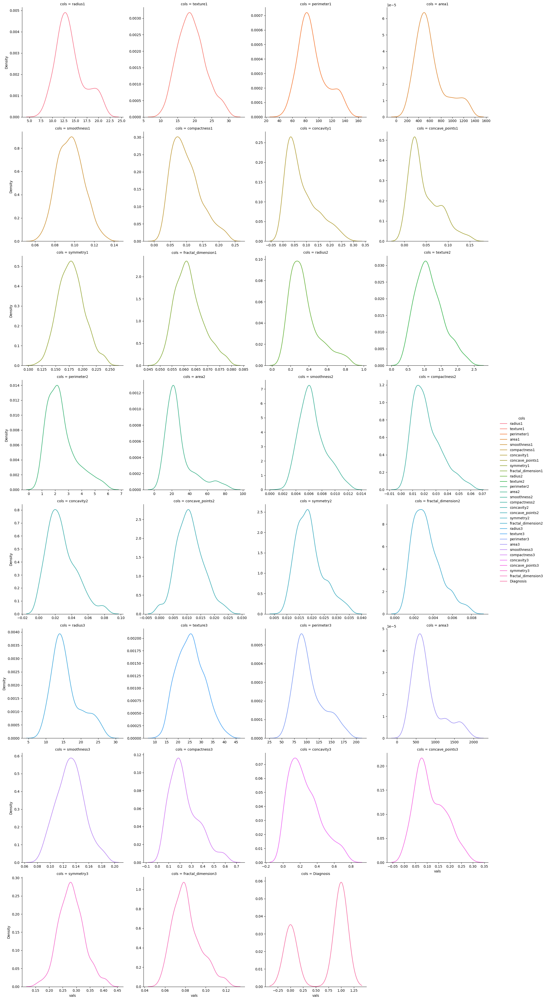

In [23]:
df1 = df.melt(var_name='cols',  value_name='vals')

sns.displot(kind='kde', data=df1, col='cols', col_wrap=4, x='vals', hue="cols", facet_kws={'sharey': False, 'sharex': False})

The data is skewed a little towards the right and center.

# Model Training

In [24]:
# Taking only the important columns
y = df["Diagnosis"]
X = df[important_columns]

In [25]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [26]:
writer = SummaryWriter() #Writer object to log records and metrics for tensorboard


# Define the neural network
class CancerClassifier(nn.Module):
    def __init__(self):
        super(CancerClassifier, self).__init__()
        self.fc1 = nn.Linear(12, 36)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(36, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x


# Convert data to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.FloatTensor(y_train.values).view(-1, 1)

# Split the data
X_train_tensor, X_val_tensor, y_train_tensor, y_val_tensor = train_test_split(
    X_train_tensor, y_train_tensor, test_size=0.2, random_state=42
)

losses = []
accuracies = []
precisions = []
recalls = []
f1_scores = []

# Initialize the model, loss function, and optimizer
model = CancerClassifier()
#Binary Cross Entropy
criterion = nn.BCELoss()

#Stochastic Gradient Descent Optimizer
optimizer = optim.SGD(model.parameters(), lr=0.1)   #Data is not noisy so lr=0.1 should work fine

# Training the model
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

    # Save loss for plotting
    losses.append(loss.item())
    writer.add_scalar('Loss/Train', loss.item(), epoch)


    # Validation metrics
    model.eval()
    with torch.no_grad():
        outputs_val = model(X_val_tensor)
        predictions_val = (outputs_val > 0.5).float()
        accuracy_val = accuracy_score(y_val_tensor.numpy(), predictions_val.numpy())
        precision_val = precision_score(y_val_tensor.numpy(), predictions_val.numpy())
        recall_val = recall_score(y_val_tensor.numpy(), predictions_val.numpy())
        f1_val = f1_score(y_val_tensor.numpy(), predictions_val.numpy())

        # Log metrics to TensorBoard
        writer.add_scalar('Accuracy', accuracy_val, epoch)
        writer.add_scalar('Precision', precision_val, epoch)
        writer.add_scalar('Recall', recall_val, epoch)
        writer.add_scalar('F1_Score', f1_val, epoch)

        accuracies.append(accuracy_val)
        precisions.append(precision_val)
        recalls.append(recall_val)
        f1_scores.append(f1_val)


In [27]:
# Evaluate the model
model.eval()
with torch.no_grad():
    outputs_val = model(X_val_tensor)
    predictions_val = (outputs_val > 0.5).float()
    accuracy_val = accuracy_score(y_val_tensor.numpy(), predictions_val.numpy())
    print(f"Validation Accuracy: {accuracy_val}")



Validation Accuracy: 0.9340659340659341


We have achieved 93% accuracy with just our 12 important features and with 20 epochs. Our model is a 2 layer Neural Network with both the layers having linear connections. The first layer has ReLU activation function and the second layer has Sigmoid activation function.

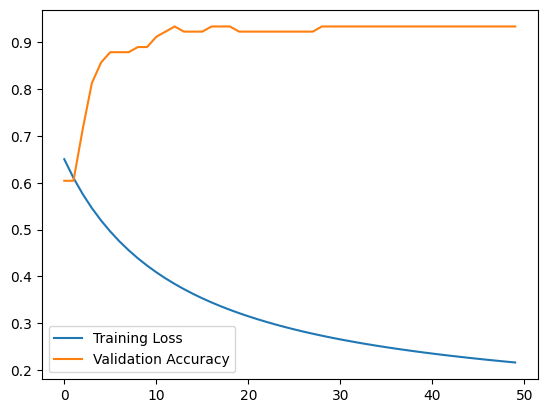

In [28]:
# Plot loss vs accuracy curves
plt.plot(losses, label="Training Loss")
plt.plot(accuracies, label="Validation Accuracy")
plt.legend()
plt.show()



Confusion Matrix:


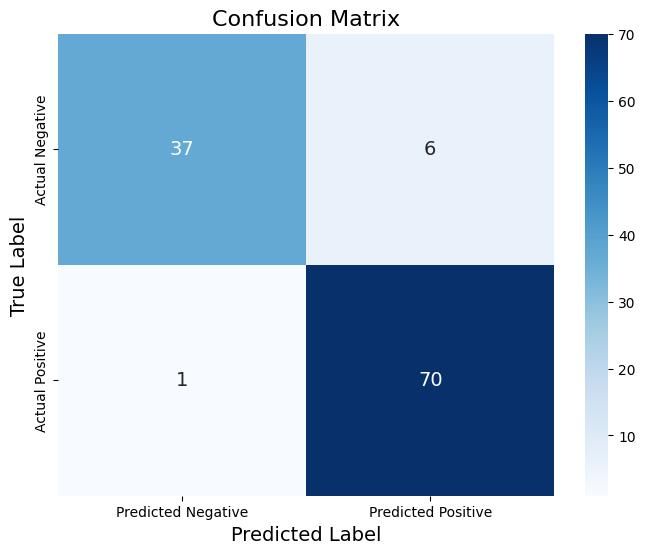

In [29]:
# Print Confusion Matrix
model.eval()
with torch.no_grad():
    outputs_test = model(torch.FloatTensor(X_test))
    predictions_test = (outputs_test > 0.5).float()

cm = confusion_matrix(y_test, predictions_test.numpy())

writer.close()

print("Confusion Matrix:")
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 14},
            xticklabels=["Predicted Negative", "Predicted Positive"],
            yticklabels=["Actual Negative", "Actual Positive"])
plt.xlabel("Predicted Label", fontsize=14)
plt.ylabel("True Label", fontsize=14)
plt.title("Confusion Matrix", fontsize=16)
plt.show()

The model has performed well as it has predicated only 1 Postive case as Negative.

## Tensorboard

In [30]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In the above graphs we can see that the learning stops after 20 to 25 epochs and hence early stopping should be considered here.